# Plotting large datasets using Datashader

There are a variety of approaches for plotting large datasets, but most of them are very unsatisfactory. Here we first show some of the issues, then demonstrate how the datashader library helps make large datasets truly practical.

## Load NYC Taxi Data

In [1]:
import pandas as pd
import urllib.request
import zipfile

link = 'http://s3.amazonaws.com/datashader-data/nyc_taxi.zip'

%time urllib.request.urlretrieve(link, "nyc_taxi.zip")
compressed_file = zipfile.ZipFile('nyc_taxi.zip')
csv_file = compressed_file.open('nyc_taxi.csv')

CPU times: user 9.07 s, sys: 5.94 s, total: 15 s
Wall time: 6min 50s


It will take 10-20 seconds, because this dataset contains more than 10 millon pickup and dropoff taxi trips in New York City.

In [2]:
import pandas as pd
%time df = pd.read_csv(csv_file, usecols= \
                       ['pickup_x', 'pickup_y', 'dropoff_x','dropoff_y', 'passenger_count','tpep_pickup_datetime'])
df.tail()

CPU times: user 19.5 s, sys: 230 ms, total: 19.7 s
Wall time: 20.5 s


,tpep_pickup_datetime,passenger_count,pickup_x,pickup_y,dropoff_x,dropoff_y
10679302,2015-01-10 19:01:44,2,-8.232298e+06,4.980860e+06,-8.232492e+06,4.979234e+06
10679303,2015-01-10 19:01:44,2,-8.235721e+06,4.972331e+06,-8.234857e+06,4.971131e+06
10679304,2015-01-10 19:01:44,1,-8.235341e+06,4.975470e+06,-8.234203e+06,4.981092e+06
10679305,2015-01-10 19:01:44,1,-8.237594e+06,4.973844e+06,-8.235618e+06,4.973722e+06
10679306,2015-01-10 19:01:45,1,-8.233229e+06,4.977946e+06,-8.234152e+06,4.977120e+06


## Define a Simple Plot

In [3]:
from bokeh.models import BoxZoomTool
from bokeh.plotting import figure, output_notebook, show

output_notebook()

NYC = x_range, y_range = ((-8242000,-8210000), (4965000,4990000))

plot_width  = int(750)
plot_height = int(plot_width//1.2)

def base_plot(tools='pan,wheel_zoom,reset',plot_width=plot_width, plot_height=plot_height, **plot_args):
    p = figure(tools=tools, plot_width=plot_width, plot_height=plot_height,
        x_range=x_range, y_range=y_range, outline_line_color=None,
        min_border=0, min_border_left=0, min_border_right=0,
        min_border_top=0, min_border_bottom=0, **plot_args)
    
    p.axis.visible = False
    p.xgrid.grid_line_color = None
    p.ygrid.grid_line_color = None
    
    p.add_tools(BoxZoomTool(match_aspect=True))
    
    return p
    
options = dict(line_color=None, fill_color='blue', size=5)

Loading BokehJS ...

## 1000-point scatterplot: undersampling

Any plotting program should be able to handle a plot of 1000 datapoints. Here the points are initially overplotting each other, but if you hit the Reset button (top right of plot) to zoom in a bit, nearly all of them should be clearly visible in the following Bokeh plot of a random 1000-point sample.

In [4]:
%%time
from bokeh.tile_providers import STAMEN_TERRAIN

samples = df.sample(n=1000)
p = base_plot()
p.add_tile(STAMEN_TERRAIN)
p.circle(x=samples['dropoff_x'], y=samples['dropoff_y'], **options)
show(p)

CPU times: user 629 ms, sys: 0 ns, total: 629 ms
Wall time: 752 ms


## 10,000-point scatterplot: overplotting

We can of course plot more points to reduce the amount of undersampling. However, even if we only try to plot 0.1% of the data, ignoring the other 99.9%, we will find major problems with overplotting.

In [5]:
%%time
samples = df.sample(n=10000)
p = base_plot()
p.add_tile(STAMEN_TERRAIN)
p.circle(x=samples['dropoff_x'], y=samples['dropoff_y'], **options)
show(p)

CPU times: user 505 ms, sys: 0 ns, total: 505 ms
Wall time: 502 ms


## 100,000-point scatterplot: saturation

If you make the dot size smaller, you can reduce the overplotting. Even so, overplotting will be unavoidable. If we adjust the alpha (opacity) parameter, multiple points need to overlap before full color saturation is achieved. With enough data, such a plot can approximate the probability density function for dropoffs, showing where dropoffs were most common:

In [6]:
%%time
options = dict(line_color=None, fill_color='blue', size=1, alpha=0.1)
samples = df.sample(n=100000)
p = base_plot()

p.circle(x=samples['dropoff_x'], y=samples['dropoff_y'], **options)
show(p)

CPU times: user 658 ms, sys: 0 ns, total: 658 ms
Wall time: 656 ms


Moreover, we're still ignoring 99% of the data.

## 10-million-point datashaded plots: auto-ranging, but limited dynamic range

The steps involved in datashading are (1) create a Canvas object with the shape of the eventual plot (i.e. having one storage bin for collecting points, per final pixel), (2) aggregating all points into that set of bins, incrementally counting them, and (3) mapping the resulting counts into a visible color from a specified range to make an image:

In [7]:
import datashader as ds
from datashader import transfer_functions as tf
from datashader.colors import Greys9
Greys9_r = list(reversed(Greys9))[:-2]

In [8]:
%%time
cvs = ds.Canvas(plot_width=plot_width, plot_height=plot_height, x_range=x_range, y_range=y_range)
agg = cvs.points(df, 'dropoff_x', 'dropoff_y',  ds.count('passenger_count'))
img = tf.shade(agg, cmap=["white", 'darkblue'], how='linear')

CPU times: user 324 ms, sys: 0 ns, total: 324 ms
Wall time: 377 ms


The resulting image is similar to the 100,000-point Bokeh plot above, but (a) makes use of all 10 million datapoints, (b) is computed in only a tiny fraction of the time, (c) does not require any magic-number parameters like size and alpha, and (d) automatically ensures that there is no saturation or overplotting:

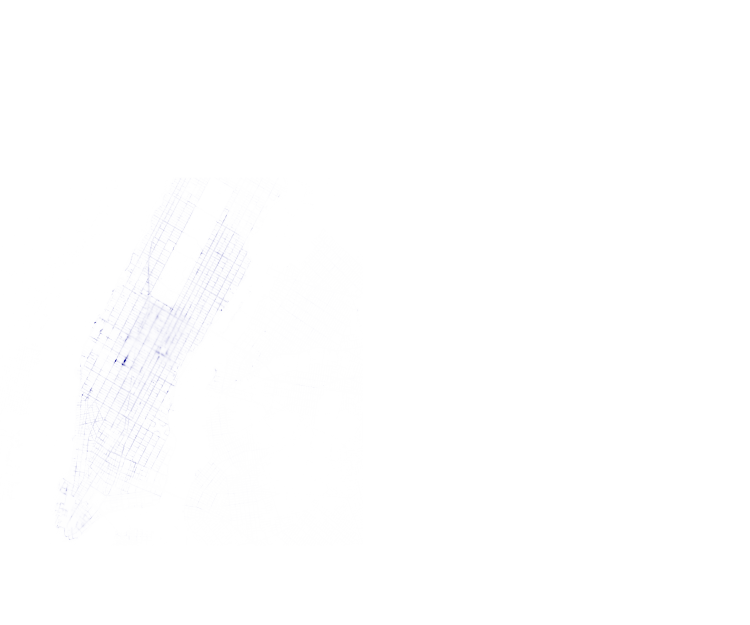

In [9]:
img

Let's look at the histogram of counts for the above image:

In [10]:
import numpy as np

def histogram(x,colors=None):
    hist,edges = np.histogram(x, bins=100)
    p = figure(y_axis_label="Pixels",
               tools='', height=130, outline_line_color=None,
               min_border=0, min_border_left=0, min_border_right=0,
               min_border_top=0, min_border_bottom=0)
    p.quad(top=hist[1:], bottom=0, left=edges[1:-1], right=edges[2:])
    print("min: {}, max: {}".format(np.min(x),np.max(x)))
    show(p)

In [11]:
histogram(agg.values)

min: 0, max: 15205


Clearly, most of the pixels have very low counts, while a very few pixels have much larger counts. When these values are mapped into colors for display, nearly all of the pixels will end up being colored with the lowest colors in the range, while the other colors in the available range will be used for only a few dozen pixels at most. It's thus very likely that we are missing a lot of the structure in this data that we could be seeing.

## 10-million-point datashaded plots: high dynamic range

We can use nonlinear scaling to map the data range into the visible color range.

min: 0.0, max: 9.629445365788381


/home/miguelangel/anaconda3/lib/python3.5/site-packages/datashader/transfer_functions.py:162: RuntimeWarning: invalid value encountered in log1p
  _interpolate_lookup = {'log': lambda d, m: np.log1p(np.where(m, np.nan, d)),


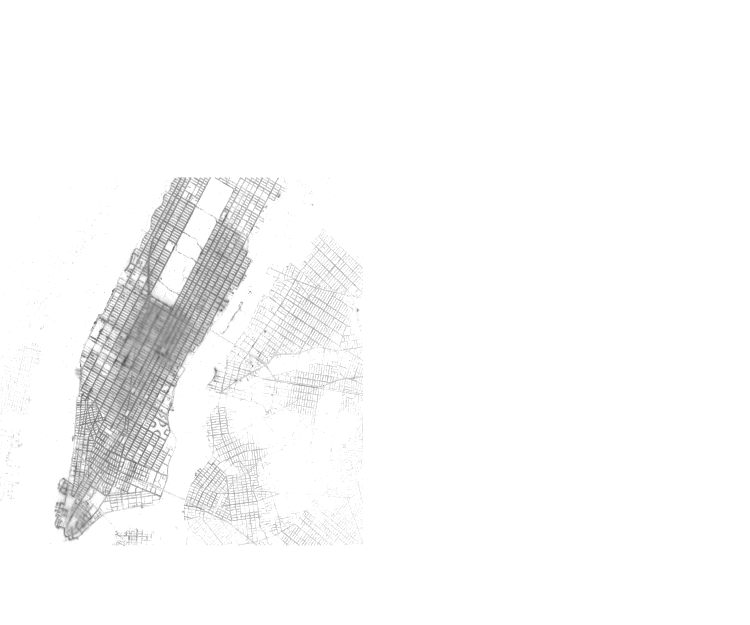

In [12]:
histogram(np.log1p(agg.values))

tf.shade(agg, cmap=Greys9_r, how='log')

min: 0.8699626666666667, max: 1.0


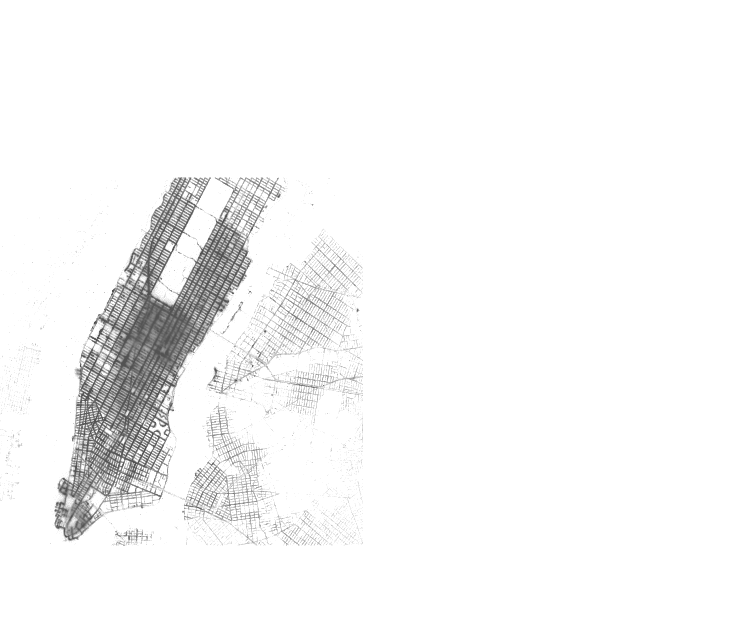

In [13]:
histogram(tf.eq_hist(agg.values))
    
tf.shade(agg, cmap=Greys9_r, how='eq_hist')

## 10-million-point datashaded plots: interactive

Although the above plots reveal the entire dataset at once, the full power of datashading requires an interactive plot, because a big dataset will usually have structure at very many different levels (such as different geographic regions).

Here we'll embed the generated images into a Bokeh plot to support fully interactive zooming.

In [14]:
import datashader as ds
from datashader.bokeh_ext import InteractiveImage
from functools import partial
from datashader.utils import export_image
from datashader.colors import colormap_select, Greys9, Hot, inferno

background = "black"
export = partial(export_image, export_path="export", background=background)
cm = partial(colormap_select, reverse=(background=="black"))

def create_image(x_range, y_range, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(df, 'dropoff_x', 'dropoff_y',  ds.count('passenger_count'))
    img = tf.shade(agg, cmap=Hot, how='eq_hist')
    return tf.dynspread(img, threshold=0.5, max_px=4)

p = base_plot(background_fill_color=background)
export(create_image(*NYC),"NYCT_hot")
InteractiveImage(p, create_image)

## Customizing datashader

Here we'll use a high-level Pipeline object that encapsulates the series of steps in the above create_image function, and then we'll customize it. 

In [15]:
import numpy as np
from functools import partial

def create_image90(x_range, y_range, w=plot_width, h=plot_height):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(df, 'dropoff_x', 'dropoff_y',  ds.count('passenger_count'))
    img = tf.shade(agg.where(agg>np.percentile(agg,90)), cmap=inferno, how='eq_hist')
    return tf.dynspread(img, threshold=0.3, max_px=4)
    
p = base_plot()
p.add_tile(STAMEN_TERRAIN)
export(create_image(*NYC),"NYCT_90th")
InteractiveImage(p, create_image90)

In the next function, we insert pickups and dropoffs and select wich one to show. In this case, the function will show pickups when these are greater than dropoffs and viceversa. 

In [16]:
def merged_images(x_range, y_range, w=plot_width, h=plot_height, how='log'):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    picks = cvs.points(df, 'pickup_x',  'pickup_y',  ds.count('passenger_count'))
    drops = cvs.points(df, 'dropoff_x', 'dropoff_y', ds.count('passenger_count'))
    drops = drops.rename({'dropoff_x': 'x', 'dropoff_y': 'y'})
    picks = picks.rename({'pickup_x': 'x', 'pickup_y': 'y'})
    more_drops = tf.shade(drops.where(drops > picks), cmap=["darkblue", 'cornflowerblue'], how=how)
    more_picks = tf.shade(picks.where(picks > drops), cmap=["darkred", 'orangered'], how=how)
    img = tf.stack(more_picks, more_drops)
    return tf.dynspread(img, threshold=0.3, max_px=4)

p = base_plot(background_fill_color=background)
export(merged_images(*NYC),"NYCT_pickups_vs_dropoffs")
InteractiveImage(p, merged_images)

/home/miguelangel/anaconda3/lib/python3.5/site-packages/datashader/transfer_functions.py:162: RuntimeWarning: invalid value encountered in log1p
  _interpolate_lookup = {'log': lambda d, m: np.log1p(np.where(m, np.nan, d)),


Now you can see that pickups are more common on major roads, as you'd expect, and dropoffs are more common on side streets.

We can also use other columns in the dataset as additional dimensions in the plot. For instance, if we want to see if certain areas are more likely to have pickups at certain hours. One way to do this is to use the hour of the day as a category, and then colorize each hour:

In [17]:
df['hour'] = pd.to_datetime(df['tpep_pickup_datetime']).dt.hour.astype('category')

In [18]:
colors = ["#FF0000","#FF3F00","#FF7F00","#FFBF00","#FFFF00","#BFFF00","#7FFF00","#3FFF00",
          "#00FF00","#00FF3F","#00FF7F","#00FFBF","#00FFFF","#00BFFF","#007FFF","#003FFF",
          "#0000FF","#3F00FF","#7F00FF","#BF00FF","#FF00FF","#FF00BF","#FF007F","#FF003F",]

def colorized_images(x_range, y_range, w=plot_width, h=plot_height, dataset="pickup"):
    cvs = ds.Canvas(plot_width=w, plot_height=h, x_range=x_range, y_range=y_range)
    agg = cvs.points(df, dataset+'_x', dataset+'_y', ds.count_cat('hour'))
    img = tf.shade(agg, color_key=colors)
    return tf.dynspread(img, threshold=0.3, max_px=4)

p = base_plot(background_fill_color=background)
#p.add_tile(STAMEN_TERRAIN)
export(colorized_images(*NYC, dataset="pickup"),"NYCT_pickup_times")
InteractiveImage(p, colorized_images, dataset="pickup")

In [19]:
export(colorized_images(*NYC, dataset="dropoff"),"NYCT_dropoff_times")
p = base_plot(background_fill_color=background)
InteractiveImage(p, colorized_images, dataset="dropoff")

Here the order of colors is roughly red (midnight), yellow (4am), green (8am), cyan (noon), blue (4pm), purple (8pm), and back to red (since hours and colors are both cyclic).